# Рынок заведений общественного питания Москвы

**Описание проекта**

Исследование рынка заведений общественного питания в Москве для фонда «Shut Up and Take My Money». В ходе исследования узнаем как обстоят дела на рынке общепита в Москве. Так же поближе взглянем на категорию Кофеен. Найдем оптимальный выбор для кофейни.

**Входные данные:** датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Задачи:**

- Открытие файла с данными и изучение общей информации

- Подготовка данных

- Анализ данных

- Изучение рынка кофеен

## Изучение данных

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import json

In [ ]:
try:
  df = pd.read_csv('/datasets/moscow_places.csv')
except:
  df = pd.read_csv('Здесь прямая ссылка на файл на сервере яндекса, но убрал её по правилам Я.Практикум ;-)')

Посмотрим на таблицу и общую информацию по ней.

In [3]:
display(df.head())

df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
print(df['category'].nunique())
df['category'].unique()

8


array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [5]:
print(df['name'].nunique())

5614


Всего в датафрейме 8405 строк.

Представлено 8 уникальных типов заведений: 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая'.

В датафрейме 5614 уникальных названий заведений. 

## Подготовка данных

Рассмотрим данные на пропуски и явные дубликаты.

In [6]:
print('Пропуски в столбцах:')
print(df.isna().sum())
print()
print('Дубликатов:',df.duplicated().sum())

Пропуски в столбцах:
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Дубликатов: 0


Пропусков в столбцах с названием, категорией, адресами, координатами и рейтингом - нет. Так же нет пропусков с столбце с отметкой сетевое заведение или нет, но там могут встречаться ошибки для маленьких сетей.

Заполнение пустых значений медианой или средним, может негативно сказаться на исследовании.

Явных дубликатов в датафрейме нет.

Избавимся от неявных дубликатов связанных с регистром в столбцах названия и адреса.

In [7]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [8]:
df[df.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
df = df.drop_duplicates(subset=['name', 'address']).reset_index()

In [10]:
print(df['name'].nunique())
print(df.shape)

5512
(8402, 15)


При первом осмотре таблицы было на 100 уникальных названий больше. Удалено 4 неявных дубликата. Подобное преобразование названий и адресов было кстати.

Добавим столбец с названиями улиц.

In [11]:
df['street']=[x.split(',')[1] for x in df['address'].values]

Добавим столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [12]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [13]:
display(df.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


Предобработка получилась небольшой. Проверили на дубликаты, явные и связанные с разным регистром. А так же проверили пропуски. Заполнять пропуски ни чем не будем. Это может негативно сказаться на итогах исследования.

Добавили 2 столбца в датафрем:
- street - с названиями улиц
- is_24_7 - с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

##  Анализ данных

**Исследуем количество объектов общественного питания по категориям.**

In [14]:
category = df['category'].value_counts().reset_index()

display(category)

,index,category
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Визуализируем полученные данные.

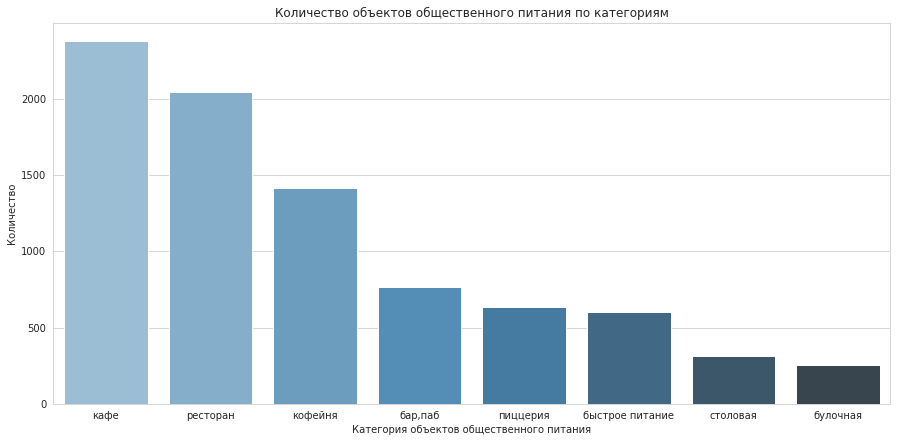

In [15]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.barplot(x='index', y=category['category'], data=category, palette='Blues_d') 

plt.ylabel('Количество')
plt.xlabel('Категория объектов общественного питания')
plt.title('Количество объектов общественного питания по категориям')
plt.show;

Топ категорий распределился следующим образом: 
- кафе - 2378
- ресторан - 2043
- кофейня - 1413.

Меньше всего столовых и булочных, их 315 и 256 соответственно.

**Исследуем количество посадочных мест в местах по категориям.**

In [16]:
seats = round(df.groupby('category').agg({'seats' : 'median', 'name' : 'count'})).reset_index()
seats.columns = ['category', 'median_seats', 'total_seats']
seats = seats.sort_values(by='median_seats', ascending=False)

display(seats)

,category,median_seats,total_seats
6,ресторан,86.0,2042
0,"бар,паб",82.0,764
4,кофейня,80.0,1413
7,столовая,76.0,315
2,быстрое питание,65.0,603
3,кафе,60.0,2376
5,пиццерия,55.0,633
1,булочная,50.0,256


Визуализируем полученные данные.

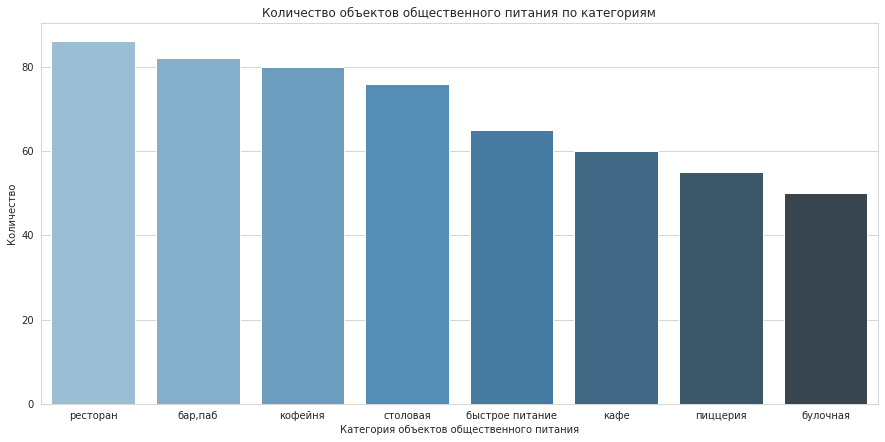

In [17]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.barplot(x='category', y=seats['median_seats'], data=seats, palette='Blues_d') 

plt.ylabel('Количество')
plt.xlabel('Категория объектов общественного питания')
plt.title('Количество объектов общественного питания по категориям')
plt.show;

В ресторанах, барах/пабах, кофейнях и столовых 86-76 посадочных мест.

Меньше всего в булочных - 50 мест.

Данные не полные и у нас нет информации по 3611 заведениям.

**Рассмотрим соотношение сетевых и несетевых заведений в датасете.**

In [18]:
chain = df.groupby('chain').agg(count=('name','count')).reset_index()

display(chain)

,chain,count
0,0,5199
1,1,3203


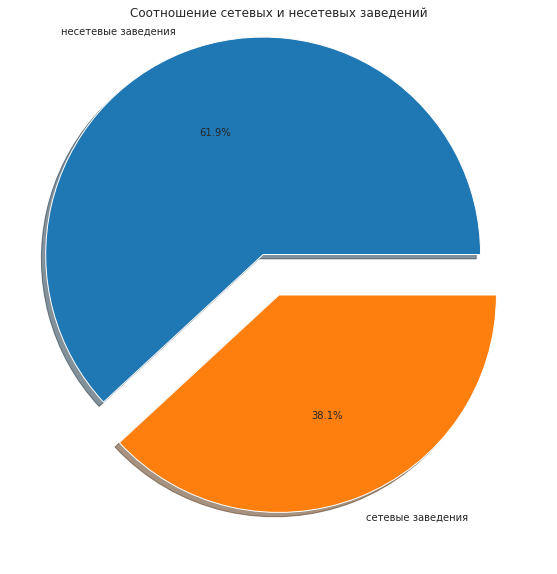

In [19]:
plt.figure(figsize=(10, 10))

plt.pie(chain['count'],
        labels=chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        autopct='%1.1f%%',
        explode = (0.2, 0),
        shadow=True)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show();

Несетевые заведения 5201, что состовляет 61,9% от общего количества заведений в файле.

**Категории заведений, которые чаще являются сетевыми.**

In [20]:
chain_type = df.groupby('category').agg({'chain' : 'sum','name' : 'count'}).reset_index()
chain_type.columns = ['category', 'chain_count', 'total_count']
chain_type['percent'] = round(chain_type['chain_count'] / chain_type['total_count'] * 100, 2)
chain_type = chain_type.sort_values('chain_count', ascending=False)
display(chain_type.sort_values(by='percent', ascending=False))

,category,chain_count,total_count,percent
1,булочная,157,256,61.33
5,пиццерия,330,633,52.13
4,кофейня,720,1413,50.96
2,быстрое питание,232,603,38.47
6,ресторан,729,2042,35.70
3,кафе,779,2376,32.79
7,столовая,88,315,27.94
0,"бар,паб",168,764,21.99


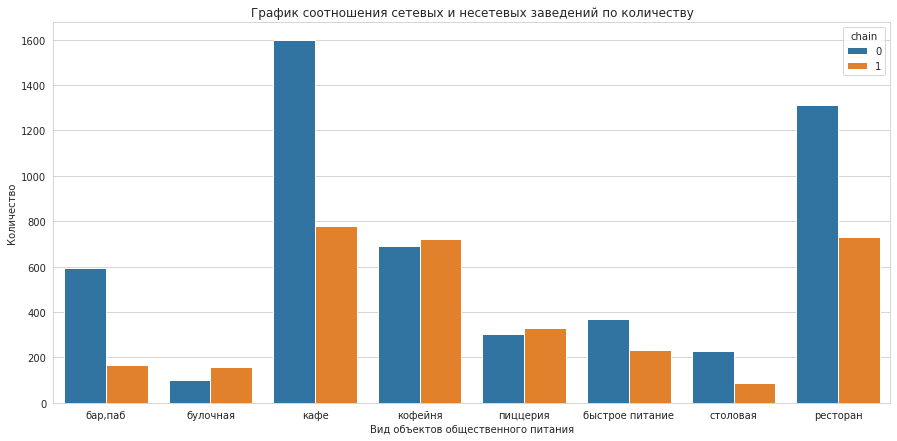

In [21]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.countplot(x="category", data=df, hue='chain',  
              order = chain_type['category'].value_counts().index)

plt.ylabel('Количество')
plt.xlabel('Вид объектов общественного питания')
plt.title('График соотношения сетевых и несетевых заведений по количеству');

Чаще всего сетевыми являются категории: булочная, пиццерия и кофейня. Но булочных не так много, всего 256 заведений из которых 61% сетевые.

Самой несетевой категорией являются бар,паб. Среди них всего 22% сетевых заведений.

**Топ-15 популярных сетей в Москве.**

In [22]:
top_15 = df[df['chain'] == 1].groupby(['name', 'category']).agg({'category': ['count']}).reset_index().droplevel(1,axis=1)
top_15.columns =['name', 'category', 'count']
top_15 = top_15.sort_values(by='count', ascending=False).head(15)

display(top_15)

,name,category,count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [23]:
fig = px.bar(top_15,
             x="name",
             y="count",
             color="category",
             title="Количество заведений по районам и категориям",
             labels={"count": "Количество", "name": "Название", "category": "Категория"})

fig.show()

Почти все из представленных сетей мне знакомы. И большенство из них кофейни.

**Посмотрим какие административные районы Москвы присутствуют в датасете.**

In [24]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В датафрейме встречаются все районы Москвы.

In [25]:
district = df.groupby(['district', 'category']).agg({'category': ['count']}).reset_index().droplevel(1,axis=1)
district.columns =['district', 'category', 'count']
district = district.sort_values(by='count', ascending=False)

In [26]:
fig = px.bar(district,
             x="count",
             y="district",
             color="category",
             title="Количество заведений по районам и категориям",
             labels={"count": "Количество", "district": "Район", "category": "Категория"})

fig.show()

Ожидаемо первые места по количеству ресторанов и кафе в Центральном районе.

**Распределение средних рейтингов по категориям заведений.**

In [27]:
rating = df.groupby(['category']).agg({'rating': ['mean']}).reset_index().droplevel(1,axis=1)
rating.columns =['category', 'mean_rating']
rating = round(rating.sort_values(by='mean_rating', ascending=False), 2)

display(rating)

,category,mean_rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [28]:
fig = px.bar(rating,
             x='category',
             y='mean_rating',
             title="Рейтинг объектов общественного питания по категориям",
             labels={"mean_rating": "Рейтинг", "category": "Категория"})
fig.show()

Различия в среднем рейтинге минимальны, но они есть. Лучший рейтинг у "бар,паб" - 4.39, а худший у категории "быстрое питание" - 4.05.

**Картограмма со средним рейтингом заведений каждого района.**

In [29]:
district_rating = df.groupby(['district']).agg({'rating': ['mean']}).reset_index().droplevel(1,axis=1)
district_rating.columns =['district', 'mean']
district_rating = district_rating.sort_values(by='mean', ascending=False)

In [30]:
with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

In [31]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

У центрального района лучший средний рейтинг. Оно и понятно, нужно держать всё на высоком уровне, что бы быть конкурентным.

**Все заведения датасета на карте.**

In [32]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Топ-15 улиц по количеству заведений и категориям.**

In [33]:
top15_street = df.groupby(['street']).agg({'category': ['count']}).reset_index().droplevel(1,axis=1)
top15_street.columns = ['street', 'count']
top15_street = top15_street.sort_values(by='count', ascending=False).head(15)

top15_street = df[df['street'].isin(top15_street['street'].unique())]


top15_street = top15_street.groupby(['street', 'category']).agg({'category': ['count']}).reset_index().droplevel(1,axis=1)
top15_street.columns = ['street', 'category', 'count']
top15_street = top15_street.sort_values(by='count', ascending=False)

In [34]:
fig = px.bar(top15_street,
             x="street",
             y="count",
             color="category",
             title="Количество заведений по улицам и категориям",
             labels={"count": "Количество", "street": "Улица", "category": "Категория"})
fig.show()

**Улицы, на которых находится только один объект общепита.**

In [35]:
solo_object = df.groupby(['street', 'district']).agg({'name': ['count']}).reset_index().droplevel(1,axis=1)
solo_object.columns = ['street', 'district', 'count']
solo_object = solo_object[solo_object['count'] == 1]
solo_object = solo_object.groupby(['district']).agg({'count': ['count']}).reset_index().droplevel(1,axis=1)
solo_object = solo_object.sort_values(by='count', ascending=False)
solo_object['count'].sum()

475

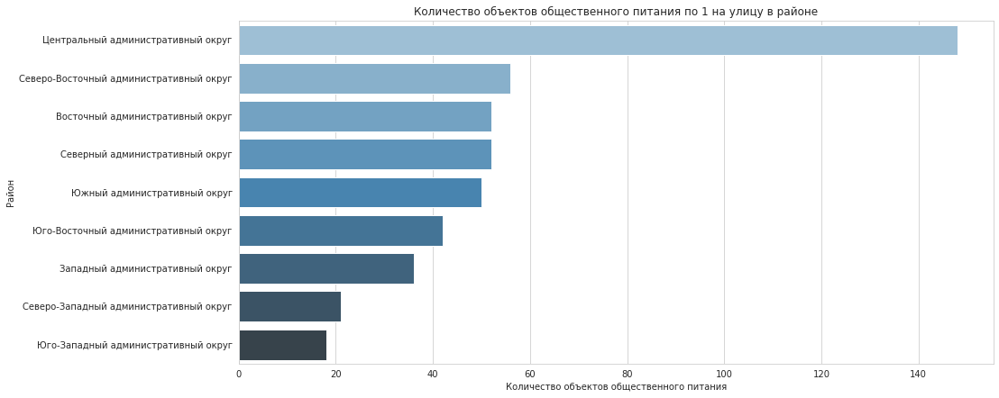

In [36]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.barplot(x='count', y='district', data=solo_object, palette='Blues_d') 

plt.ylabel('Район')
plt.xlabel('Количество объектов общественного питания')
plt.title('Количество объектов общественного питания по 1 на улицу в районе')
plt.show;

Всего получилось 475 улиц с 1 заведением.

Больше всего таких улиц в центре. Это логично учитывая, что там больше всего заведений и очень много маленьких улочек.

**Значения средних чеков заведений по районам.**

In [37]:
middle_avg_bill = df.groupby(['district']).agg({'middle_avg_bill': ['median']}).reset_index().droplevel(1,axis=1)
middle_avg_bill.dropna(subset=['middle_avg_bill'], inplace=True)

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.5,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Средний чек в центральном административном округе самые высокие так же, как и в ЗАО. Самый низкий средний чек в ЮАО, ЮВАО и СВАО.

**Вывод**

Количество объектов по категориям:
- кафе - 2378
- ресторан - 2043
- кофейня - 1413
- бар,паб - 764
- пиццерия - 633
- быстрое питание - 603
- столовая - 315
- булочная - 256


Данные по посадочным местам не полные и у нас нет информации по 3611 заведениям, но можем сделать следующие выводы:
- в ресторанах, барах/пабах, кофейнях и столовых 76-86 посадочных мест в медиане
- меньше всего в булочных - 50 мест в медиане


Несетевые заведения 5201, что состовляет 61,9% от общего количества заведений в файле.

Больше всего заведений, больший средний чек и лучший рейтинг заведений в ЦАО.

## Детализируем исследование: открытие кофейни

Ответим на вопросы, которые помогут определиться клиентам с открытием кофейни.

**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [39]:
cofe = df.groupby(['category', 'district']).agg({'name': ['count']}).reset_index().droplevel(1,axis=1)
cofe.columns = ['category', 'district', 'count']
cofe = cofe[cofe['category'] == 'кофейня']
cofe = cofe.sort_values(by='count', ascending=False)

print('Всего кофейн:', cofe['count'].sum())

Всего кофейн: 1413


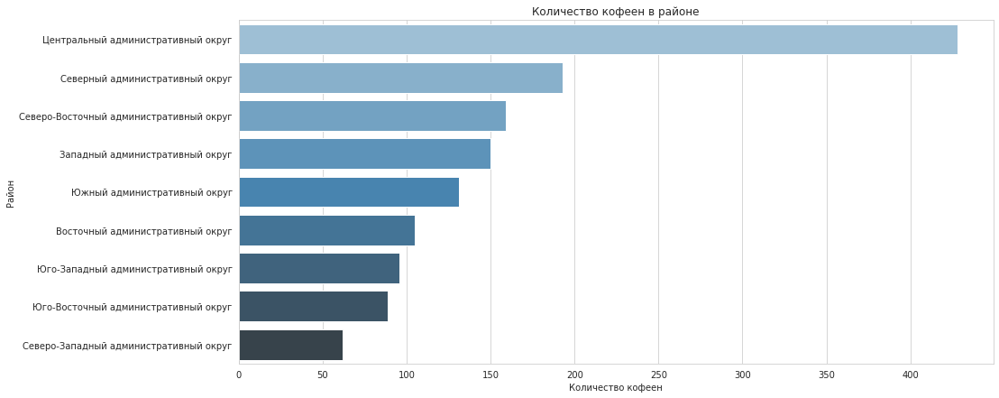

In [40]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.barplot(x='count', y='district', data=cofe, palette='Blues_d') 

plt.ylabel('Район')
plt.xlabel('Количество кофеен')
plt.title('Количество кофеен в районе')
plt.show;

Больше всего кофеин находится в центральном районе - 428. Меньше всего в СЗАО - 62 на район.

**Есть ли круглосуточные кофейни?**

In [41]:
cofe = df.groupby(['category', 'district', 'is_24_7']).agg({'name': ['count']}).reset_index().droplevel(1,axis=1)
cofe.columns = ['category', 'district', 'is_24_7', 'count']
cofe = cofe[cofe['category'] == 'кофейня']
cofe = cofe[cofe['is_24_7'] == True]
cofe = cofe.sort_values(by='count', ascending=False)

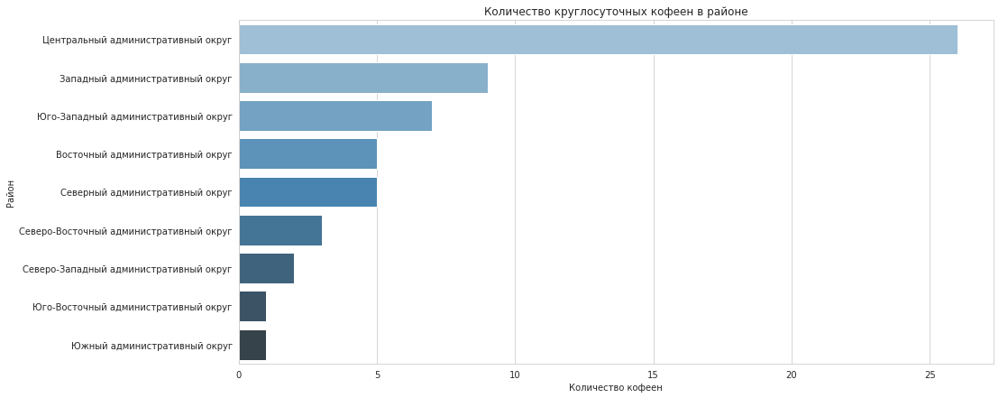

In [42]:
plt.figure(figsize=(15, 7))
sns.set_style('whitegrid')

sns.barplot(x='count', y='district', data=cofe, palette='Blues_d') 

plt.ylabel('Район')
plt.xlabel('Количество кофеен')
plt.title('Количество круглосуточных кофеен в районе')
plt.show;

Круглосуточных не много, но они есть. Больше всего в центральном районе.

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [43]:
cofe = df.groupby(['category', 'district']).agg({'rating': ['mean']}).reset_index().droplevel(1,axis=1)
cofe.columns = ['category', 'district', 'rating_mean']
cofe = cofe[cofe['category'] == 'кофейня']
cofe = cofe.sort_values(by='rating_mean', ascending=False)

In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Рейтинг кофеен от района к району меняется не так кардинально. Лучшие в ЦАО, худшие в ЗАО.

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [45]:
cofe = df.groupby(['category', 'district']).agg({'middle_coffee_cup': ['median']}).reset_index().droplevel(1,axis=1)
cofe.columns = ['category', 'district', 'middle_coffee_cup']
cofe = cofe[cofe['category'] == 'кофейня']
cofe = cofe.sort_values(by='middle_coffee_cup', ascending=False)

In [46]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Самая высокая цена чашки кофе в ЮЗАО, ЦАО и ЗАО - около 200 р. В ВАО самый низкий средний чек - около 135 р. В целом на Востоке Москвы кофе дешевле, чем в других направлениях.

## Вывод

Осуществлять такую мечту можно и нужно в правильном месте. По сценарию оригинальное кафе находилось в жилом доме между набережной реки Гудзон и парком Вашингтон-Сквер. Плюс недалеко были другие известные парки и сооружения, типа Флейтайрон-Билдинг. Как по мне идеальным районом для такого кафе является ЗАО. Так же если выбрать локацию сразу за ТТК по Кутузовскому проспекту, то это будет очень похожая локация. Кафе будет распологаться между знаменитым и красивым Парком Победы, а если идти в сторону центра, то будет набережная реки Москвы. На которой находится красивое и знаковое здание гостиницы Редиссон. Плюсом будут высотки Москва-Сити сразу за рекой.

В ЗАО отличный показатель стоимости чашки кофе и не такое большое количество кофеен как в ЦАО, где конкуренция будет очень высокой. На Кутузовском проспекте, который достаточно длинный, наполненный разными заведениями и интересными местами не так много кофеен.

Презентация: <https://drive.google.com/file/d/1eUNQkqvIq585vgofDXf9AQrzl0X4coOj/view?usp=sharing>